# <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#9c7606; font-size:140%; text-align:left;padding: 10px; border-bottom: 2px solid #f79a05"> Import Libraries</p>

In [1]:
import numpy as np
import pandas as pd
import cv2

from sklearn.utils import shuffle
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt

import warnings

warnings.simplefilter('ignore')

### <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#9c7606; font-size:140%; text-align:left;padding: 10px; border-bottom: 2px solid #f79a05"> Load data</p>

In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="BpN05bgiY6rY6QIGdq82")
project = rf.workspace("project-ninjarevenger").project("ninja-hand-gesture")
version = project.version(2)
dataset = version.download("tensorflow")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Ninja-hand-gesture-2 in tensorflow:: 100%|██████████| 636/636 [00:00<00:00, 2306.50it/s]


In [28]:
!cat /kaggle/working/Ninja-hand-gesture-2/train/_annotations.csv

filename,width,height,class,xmin,ymin,xmax,ymax
Ink-2-_jpg.rf.eb6f667c8167650cdb10b14a6a58b927.jpg,1479,1109,Bird,784,377,1212,976
Nata-28-_jpg.rf.ec4f272b11d963e1d8826f6217d332cd.jpg,1280,720,Fox,350,287,597,611
Random-2-_jpg.rf.ec6a71253ba93921381f4c9b2774b853.jpg,960,1280,Dog,141,650,682,1072
Ink-31-_jpg.rf.ed91359b761dbab2139e2dc8e66e0e3d.jpg,1479,1109,Bomb,162,254,631,859
Prab-38-_jpg.rf.eed80978b4ac90796f758756bf19adb9.jpg,1109,1479,Tiger,117,686,430,1073
June-14-_jpg.rf.ef87d24f8ba836d89c3dadb7a2a77150.jpg,1109,1479,Hare,339,609,1057,1190
Tor-82-_jpg.rf.ed97f9f60b4ab5a35f4d4d63825f7adf.jpg,1109,1479,Divine punishment,273,430,446,839
Tor-61-_jpg.rf.f0981cec7679d433911d254b04aa6101.jpg,1109,1479,Butterfly,305,205,932,590
Ink-22-_jpg.rf.ecaa4f637c237a9c56217fd45ae016ca.jpg,1479,1109,Butterfly,200,236,1026,771
Prab-22-_jpg.rf.f2c5d5279afb0016d5e63616ae6aad9f.jpg,1109,1479,Horse,559,606,1000,935
Tor-54-_jpg.rf.eaea17b94db032ae577f5c4d64abba26.jpg,1109,1479,Grave,38,305,639,573
Prab-4

In [29]:
df = pd.read_csv(r'/kaggle/working/Ninja-hand-gesture-2/train/_annotations.csv')
df = shuffle(df)
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
302,Mark-10-_jpg.rf.85a23421628662f3f2c2236d0c6557...,1109,1479,Full moon,401,254,838,935
99,Ink-15-_jpg.rf.182371951c570050bbbdab0d2627d32...,1479,1109,Grave,68,554,1080,899
116,Foam-2-_jpg.rf.21255ba271a1c2a0ba14b0ca12b4279...,960,1280,Bullet,373,370,751,545
269,Prab-36-_jpg.rf.78069f6a12a5fe8fbec34b2e3c474a...,1109,1479,Tiger,339,859,653,1281
126,Nata-32-_jpg.rf.2770e2fdf659ff6a450a8487d3420f...,1280,720,Butterfly,233,286,909,641


<div style="border-radius:10px; border:#f79a05 solid; padding: 15px; background-color: #f5d77f; font-size:100%; text-align:left">
    
 * This dataset is mostly a practice and training aspect for the subject of YOLO. The data is labeled with 5 classes.
 * classic_id labels: 'car', 'truck', 'pedestrian', 'bicyclist', 'light'

In [34]:
classes = df["class"].unique()
print(classes)

['Full moon' 'Grave' 'Bullet' 'Tiger' 'Butterfly' 'Bird' 'Hare'
 'Cow-s blood' 'Prevention' 'Heart' 'Unleash' 'Rat' 'Fox' 'Bomb'
 'Divine punishment' 'Dog' 'Dragon' 'Horse' 'Iron wall' 'Serpant']


In [49]:
count=1
labels={}
for i in classes:
    labels[i]=count
    count+=1
labels

{'Full moon': 1,
 'Grave': 2,
 'Bullet': 3,
 'Tiger': 4,
 'Butterfly': 5,
 'Bird': 6,
 'Hare': 7,
 'Cow-s blood': 8,
 'Prevention': 9,
 'Heart': 10,
 'Unleash': 11,
 'Rat': 12,
 'Fox': 13,
 'Bomb': 14,
 'Divine punishment': 15,
 'Dog': 16,
 'Dragon': 17,
 'Horse': 18,
 'Iron wall': 19,
 'Serpant': 20}

# <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#9c7606; font-size:140%; text-align:left;padding: 10px; border-bottom: 2px solid #f79a05"> Show some labeled images</p>

In [47]:
# Get path images and boxes (x,y) for each class_id
boxes = {}
images = {}

base_path = '/kaggle/working/Ninja-hand-gesture-2/train/'

for class_id in classes:
    first_row = df[df['class'] == class_id].iloc[0]
    #print(first_row)
    images[class_id] = cv2.imread(base_path + first_row['filename'])
    boxes[class_id] = [first_row['xmin'],first_row['xmax'],first_row['ymin'],first_row['ymax']]

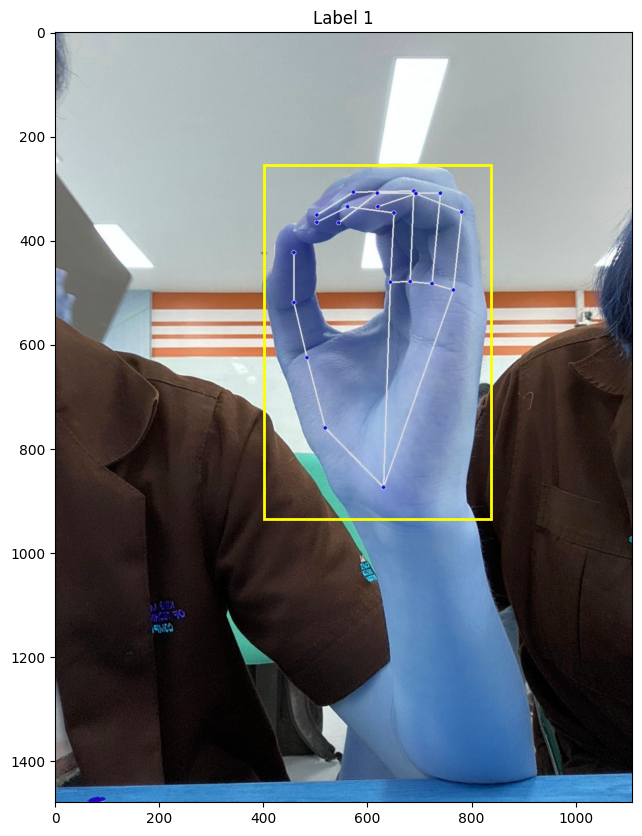

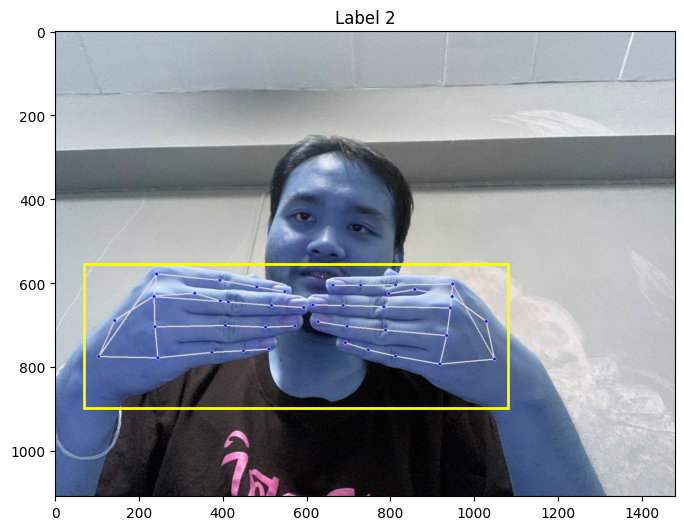

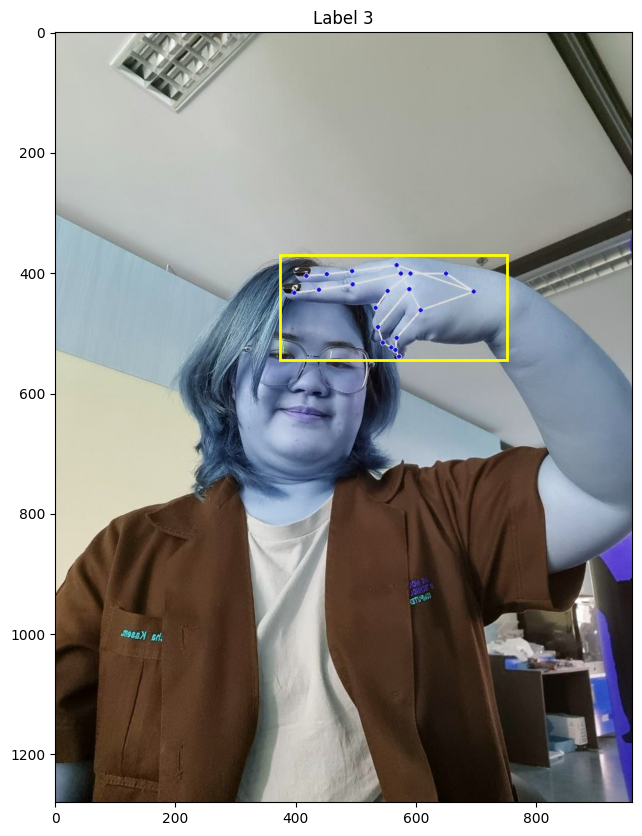

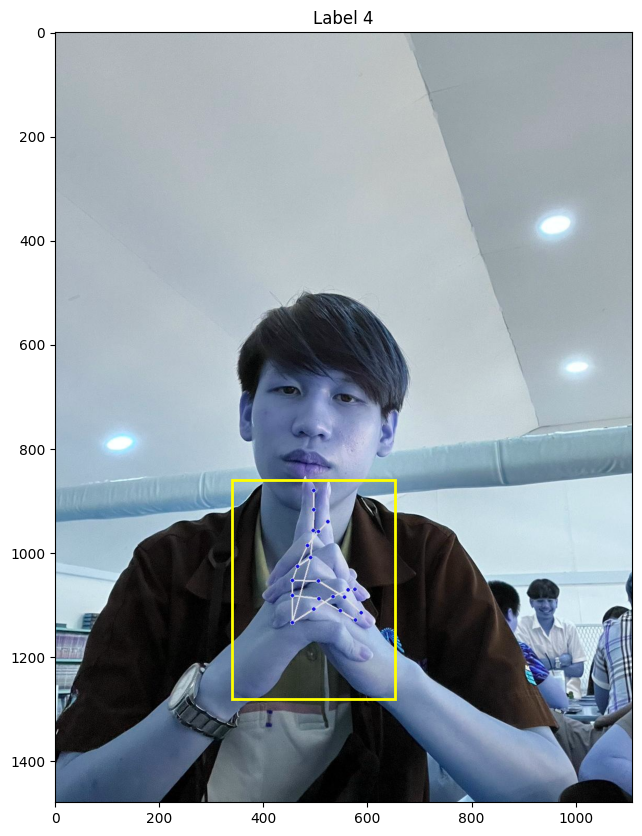

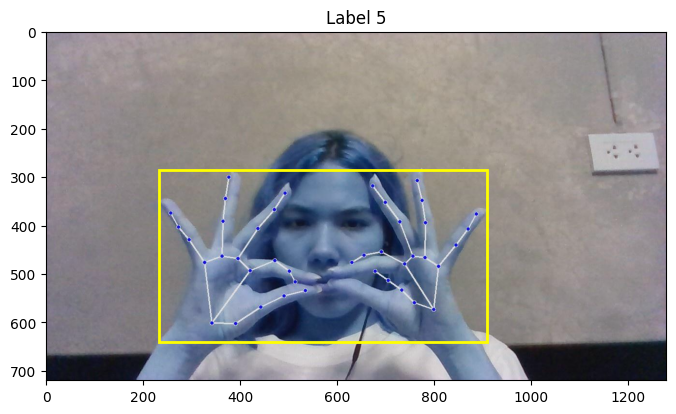

...

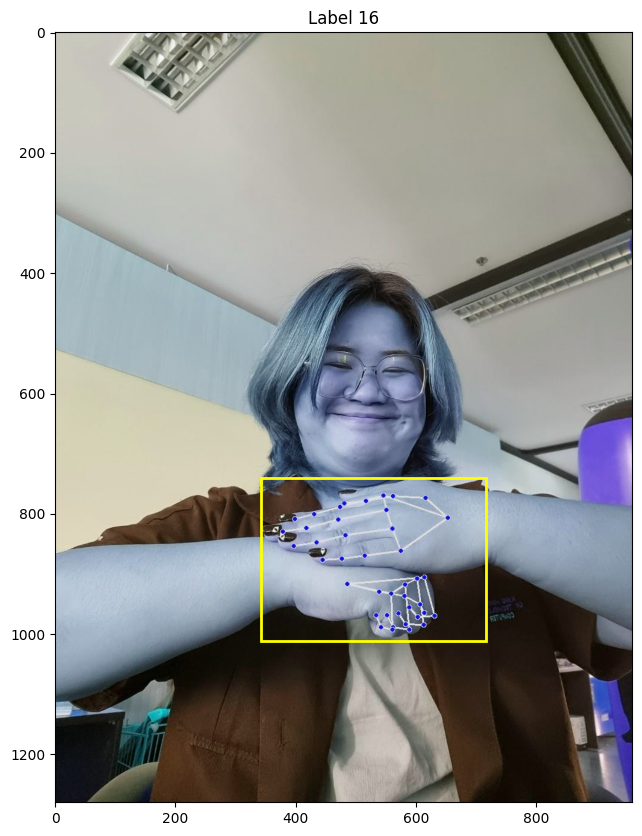

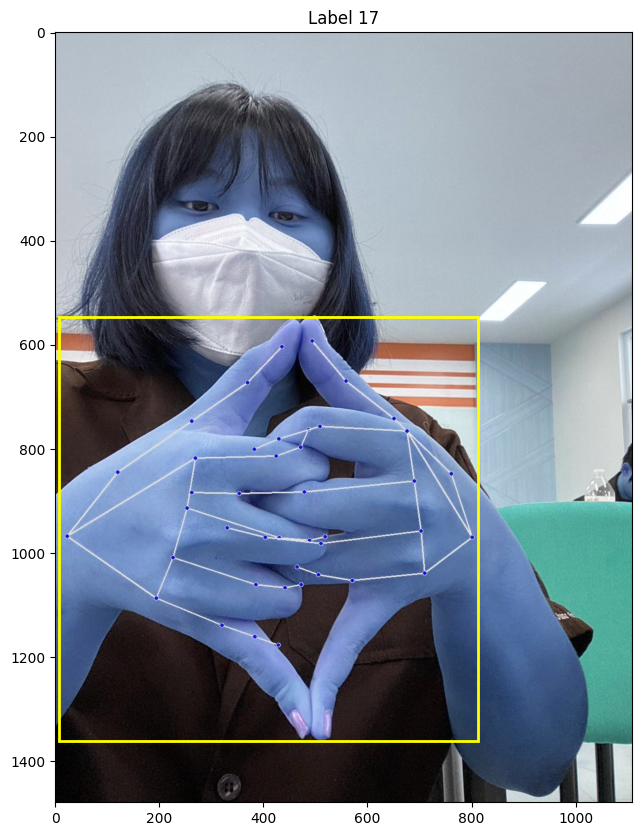

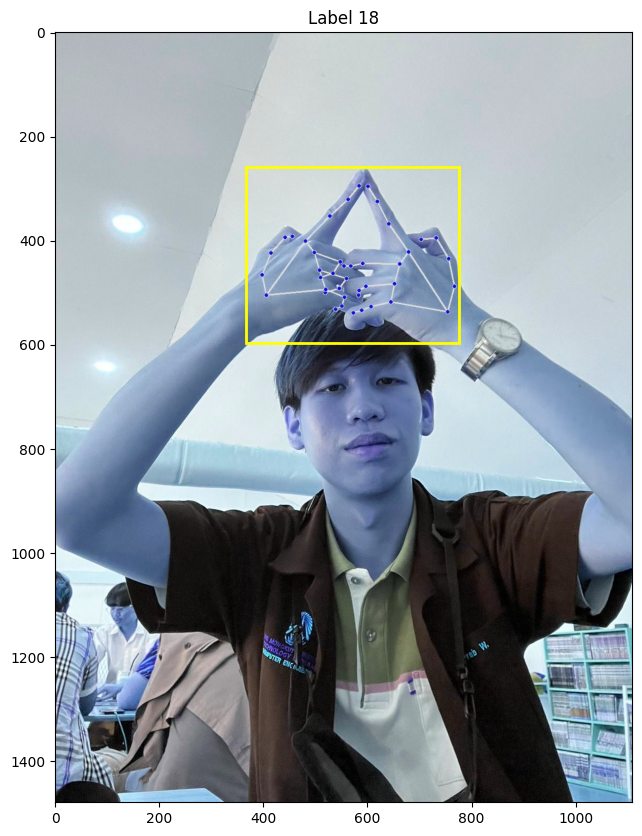

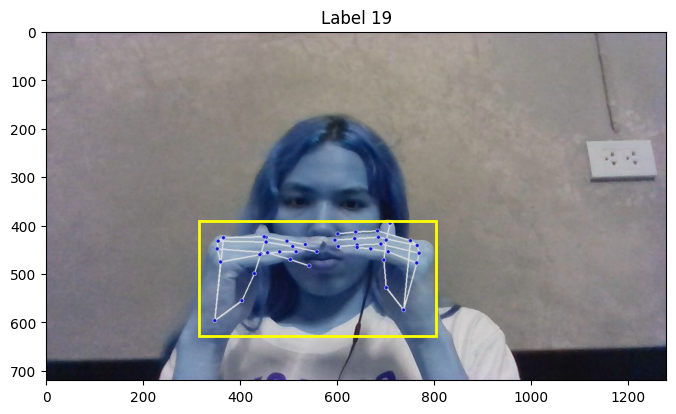

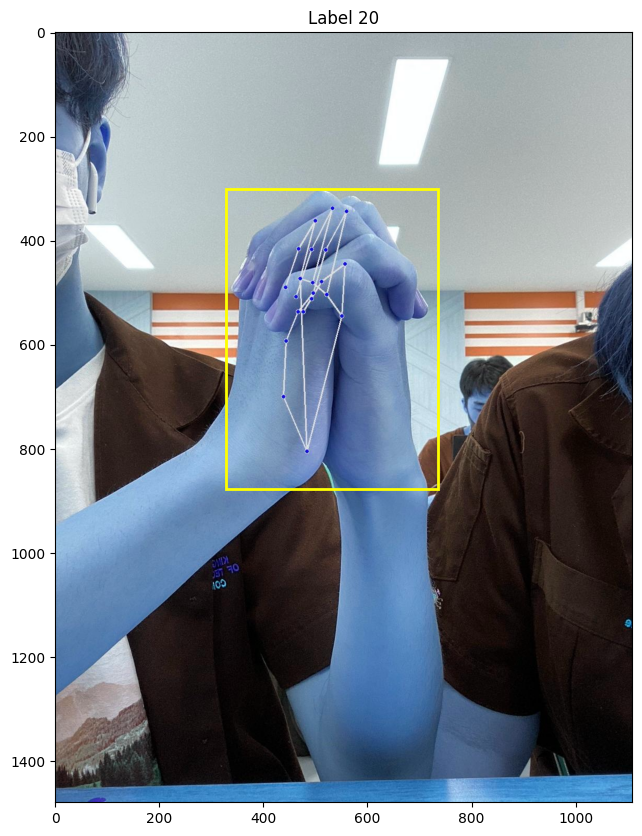

In [51]:
for i in classes:

    xmin, xmax, ymin, ymax = boxes[i][0], boxes[i][1], boxes[i][2], boxes[i][3]

    plt.figure(figsize=(8, 10))
    plt.title("Label " + str(labels[i]))
    plt.imshow(images[i])
    plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, color='yellow', fill=False, linewidth=2))

    plt.show()

# <p style="font-family:JetBrains Mono; font-weight:bold; letter-spacing: 2px; color:#9c7606; font-size:140%; text-align:left;padding: 10px; border-bottom: 2px solid #f79a05"> Model</p>

In [52]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.7/40.7 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.4/756.4 kB 11.4 MB/s eta 0:00:00a 0:00:01


In [53]:
from ultralytics import YOLO
import PIL
from PIL import Image
from IPython.display import display
import os
import pathlib

In [54]:
model = YOLO("yolov8m.pt")

100%|██████████| 49.7M/49.7M [00:00<00:00, 73.0MB/s]


In [55]:
!ls /kaggle/working/Ninja-hand-gesture-2/test/Noon-11-_jpg.rf.6565694af12b7953815fbfe421fd9d75.jpg

Noon-11-_jpg.rf.6565694af12b7953815fbfe421fd9d75.jpg
Noon-16-_jpg.rf.ff74b301d93efa079f03aa7ed1ea1275.jpg
Noon-17-_jpg.rf.019624e27b324db5391caeace173b775.jpg
Noon-18-_jpg.rf.fd5ef87778c0d2081a3e9421934d1f29.jpg
Noon-19-_jpg.rf.ab2f36fd10aaf0a418104e5e39f8026b.jpg
Noon-20-_jpg.rf.859402a3ac1d1cfcf1c3d2972c552fca.jpg
Noon-8-_jpg.rf.ce480309160d5d773316e5b7f3cc207c.jpg
Prab-27-_jpg.rf.2e95f2f851b887d2b28bdb9a4e208782.jpg
Prab-35-_jpg.rf.7d4d1ec10967da4f87b581c492341ccd.jpg
Prab-47-_jpg.rf.702cea8d91396b15903f5f91047c52b2.jpg
Prab-59-_jpg.rf.8d6136bd03fef97c34a26100795312df.jpg
Random-1-_jpg.rf.1f8dafdf8c0ef88f908b133e7c004d25.jpg
Random-11-_jpg.rf.74f6fcec0357146c0f591a40b7794e1d.jpg
Random-13-_jpg.rf.597f4c14b2b3a68127bb4a4f0836fd92.jpg
Random-15-_jpg.rf.fa3dcf832d741872df885c23ae2ea17a.jpg
Random-16-_jpg.rf.eb90ee65246cd2279ca94cbdf83441c7.jpg
Random-22-_jpg.rf.753671e4e7b584c95ac3b860a8067acd.jpg
Random-23-_jpg.rf.7ea058377d6ea7a6383541c0d4c8d84c.jpg
Random-24-_jpg.rf.4be114fa437d2e80

In [56]:
results=model.predict(source="/kaggle/working/Ninja-hand-gesture-2/test/Noon-11-_jpg.rf.6565694af12b7953815fbfe421fd9d75.jpg",
              save=True, conf=0.2,iou=0.5)


image 1/1 /kaggle/working/Ninja-hand-gesture-2/test/Noon-11-_jpg.rf.6565694af12b7953815fbfe421fd9d75.jpg: 640x480 6 persons, 2 chairs, 769.4ms
Speed: 6.0ms preprocess, 769.4ms inference, 3041.9ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/detect/predict


In [57]:
result = results[0]
box = result.boxes[0]

In [58]:
for result in results:
    boxes = result.boxes  # Boxes object for bbox outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    probs = result.probs  # Class probabilities for classification outputs

In [59]:
cords = box.xyxy[0].tolist()
class_id = box.cls[0].item()
conf = box.conf[0].item()
print("Object type:", class_id)
print("Coordinates:", cords)
print("Probability:", conf)

Object type: 0.0
Coordinates: [277.5472106933594, 592.97607421875, 958.9871826171875, 1279.11767578125]
Probability: 0.9617164134979248


In [60]:
for box in result.boxes:
    class_id = result.names[box.cls[0].item()]
    cords = box.xyxy[0].tolist()
    cords = [round(x) for x in cords]
    conf = round(box.conf[0].item(), 2)
    print("Object type:", class_id)
    print("Coordinates:", cords)
    print("Probability:", conf)
    print("---")

Object type: person
Coordinates: [278, 593, 959, 1279]
Probability: 0.96
---
Object type: person
Coordinates: [760, 677, 960, 984]
Probability: 0.89
---
Object type: person
Coordinates: [2, 943, 345, 1278]
Probability: 0.88
---
Object type: person
Coordinates: [391, 852, 474, 908]
Probability: 0.79
---
Object type: chair
Coordinates: [116, 1002, 330, 1113]
Probability: 0.73
---
Object type: person
Coordinates: [20, 929, 83, 985]
Probability: 0.61
---
Object type: chair
Coordinates: [147, 1056, 298, 1201]
Probability: 0.59
---
Object type: person
Coordinates: [19, 930, 116, 1018]
Probability: 0.39
---


In [61]:
results1 = model.predict(source="/kaggle/working/Ninja-hand-gesture-2/test/Prab-27-_jpg.rf.2e95f2f851b887d2b28bdb9a4e208782.jpg",
              save=True, conf=0.2,iou=0.5)

Results = results1[0]


image 1/1 /kaggle/working/Ninja-hand-gesture-2/test/Prab-27-_jpg.rf.2e95f2f851b887d2b28bdb9a4e208782.jpg: 640x480 4 persons, 2 books, 1 clock, 636.7ms
Speed: 3.5ms preprocess, 636.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/detect/predict


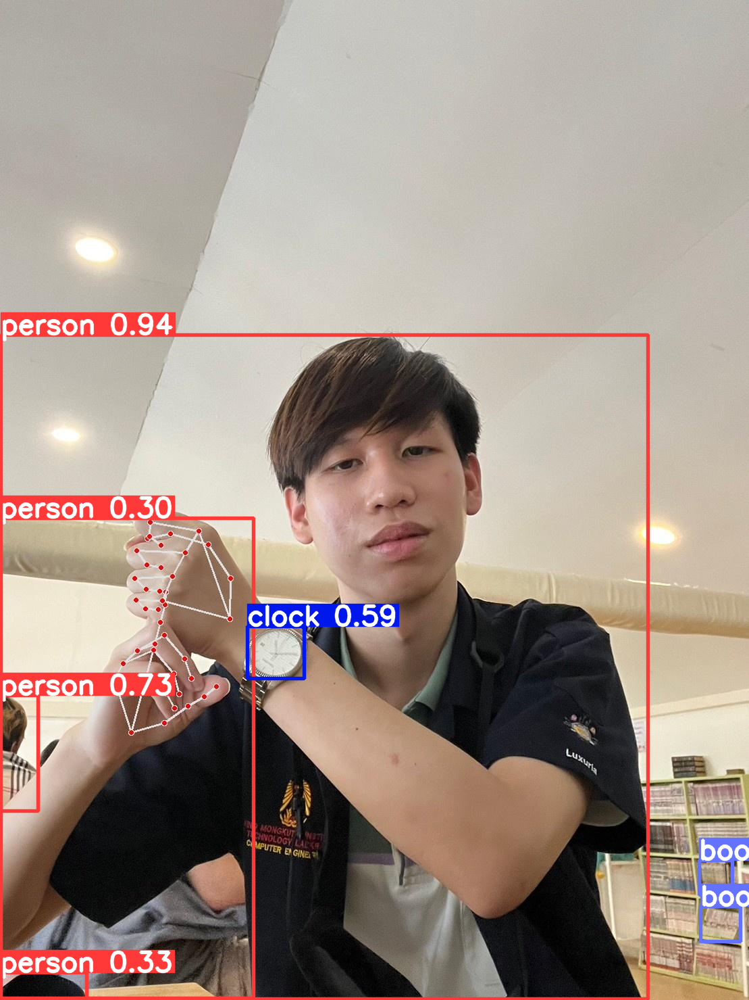

In [62]:
# Plotting results
plot = results1[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))